<a href="https://colab.research.google.com/github/shizakhurram/Hyperspectral_Image_Classification/blob/main/Classifications_HSI_Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Packages Installations

In [ ]:
!pip install kagglehub
!pip install keras
!pip install spectral
!pip install pydot
!pip install graphviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.9/212.9 kB 5.1 MB/s eta 0:00:00


## Dataset Download

In [ ]:
import numpy as np
from pathlib import Path
import kagglehub
pavia_path = kagglehub.dataset_download('mlxlx0000/paviadata')
syamkakarla_pavia_path = kagglehub.dataset_download('syamkakarla/pavia-university-hsi')
indian_pines = kagglehub.dataset_download('freeman2147/1992-indian-pines')

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
import scipy.io as sio
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import os
import random
from random import shuffle
from skimage.transform import rotate
import scipy.ndimage
import matplotlib.pyplot as plt
import scipy
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.optimizers import SGD
from keras import backend as K
K.set_image_data_format('channels_last')
from keras.utils import to_categorical
import scipy.io as sio

This Code will load hyperspectral image datasets and their corresponding ground truth (GT) labels from .mat files. The datasets include:



*   Indian Pines
*   Pavia Centre

*   Pavia University


The .mat files are loaded using the scipy.io (sio) library, and the relevant data arrays are extracted for further processing or analysis.

In [ ]:
indian_pines_path=os.path.join(indian_pines,"Indian_pines_corrected.mat")
indian_pines_gt_path=os.path.join(indian_pines,"Indian_pines_gt.mat")
pavia_centre_path=os.path.join(pavia_path,"pavia centre/Pavia.mat")
pavia_centre_gt_path=os.path.join(pavia_path,"pavia centre/Pavia_gt.mat")
pavia_university_path=os.path.join(syamkakarla_pavia_path,"PaviaU.mat")
pavia_university_gt_path=os.path.join(syamkakarla_pavia_path,"PaviaU_gt.mat")


indian_pines_data = sio.loadmat(indian_pines_path)['indian_pines_corrected']
indian_pines_gt = sio.loadmat(indian_pines_gt_path)['indian_pines_gt']

pavia_centre_data = sio.loadmat(pavia_centre_path)['pavia']
pavia_centre_gt = sio.loadmat(pavia_centre_gt_path)['pavia_gt']

pavia_university_data = sio.loadmat(pavia_university_path)['paviaU']
pavia_university_gt = sio.loadmat(pavia_university_gt_path)['paviaU_gt']

In [ ]:
datasets = [(indian_pines_data, indian_pines_gt, "Indian Pines"),
            (pavia_centre_data, pavia_centre_gt, "Pavia Centre"),
            (pavia_university_data, pavia_university_gt, "Pavia University")]

print("Indian Pines data shape:", indian_pines_data.shape)
print("Indian Pines ground truth shape:", indian_pines_gt.shape)
print()
print("Pavia Centre data shape:", pavia_centre_data.shape)
print("Pavia Centre ground truth shape:", pavia_centre_gt.shape)
print()
print("Pavia University data shape:", pavia_university_data.shape)
print("Pavia University ground truth shape:", pavia_university_gt.shape)

Indian Pines data shape: (145, 145, 200)
Indian Pines ground truth shape: (145, 145)

Pavia Centre data shape: (1096, 715, 102)
Pavia Centre ground truth shape: (1096, 715)

Pavia University data shape: (610, 340, 103)
Pavia University ground truth shape: (610, 340)


## Data Exploaration and Visualization

In [ ]:
import numpy as np

def get_dataset_info(dataset_name, dataset, ground_truth):
    print(f"Dataset: {dataset_name}")
    print(f"Dimensions (width, height, bands): {dataset.shape}")
    print(f"Number of Bands: {dataset.shape[2]}")
    print(f"Ground Truth Classes: {np.unique(ground_truth)}")
    print()

for dataset, ground_truth, dataset_name in datasets:
    get_dataset_info(dataset_name, dataset, ground_truth)

Dataset: Indian Pines
Dimensions (width, height, bands): (145, 145, 200)
Number of Bands: 200
Ground Truth Classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]

Dataset: Pavia Centre
Dimensions (width, height, bands): (1096, 715, 102)
Number of Bands: 102
Ground Truth Classes: [0 1 2 3 4 5 6 7 8 9]

Dataset: Pavia University
Dimensions (width, height, bands): (610, 340, 103)
Number of Bands: 103
Ground Truth Classes: [0 1 2 3 4 5 6 7 8 9]



In [ ]:
import pandas as pd

for X, y, dataset_name in datasets:
    print(f"Dataset: {dataset_name}")
    # Get unique class names based on ground truth labels for the current dataset
    class_names = np.unique(y)
    # Calculate the number of samples for each class
    summary = pd.DataFrame([{'class_name': label, 'samples': np.sum(y == val)} for val, label in enumerate(class_names)])
    print(summary)
    print()

Dataset: Indian Pines
    class_name  samples
0            0    10776
1            1       46
2            2     1428
3            3      830
4            4      237
5            5      483
6            6      730
7            7       28
8            8      478
9            9       20
10          10      972
11          11     2455
12          12      593
13          13      205
14          14     1265
15          15      386
16          16       93

Dataset: Pavia Centre
   class_name  samples
0           0   635488
1           1    65971
2           2     7598
3           3     3090
4           4     2685
5           5     6584
6           6     9248
7           7     7287
8           8    42826
9           9     2863

Dataset: Pavia University
   class_name  samples
0           0   164624
1           1     6631
2           2    18649
3           3     2099
4           4     3064
5           5     1345
6           6     5029
7           7     1330
8           8     3682
9           9

**Class Distribution Visualization**

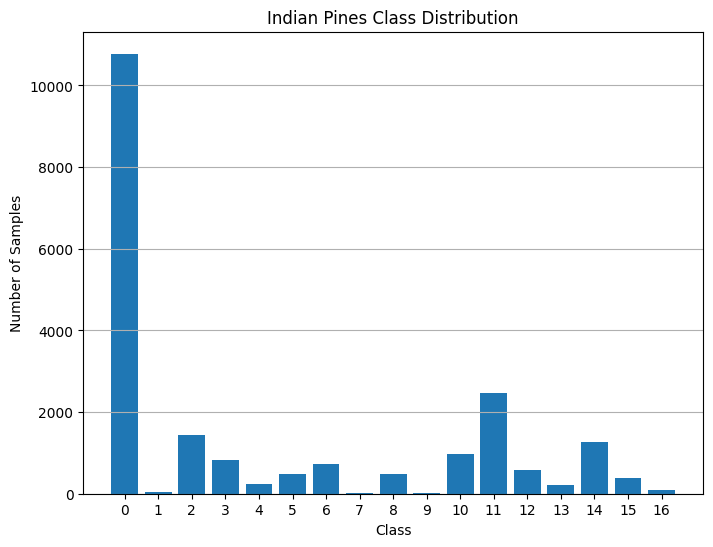

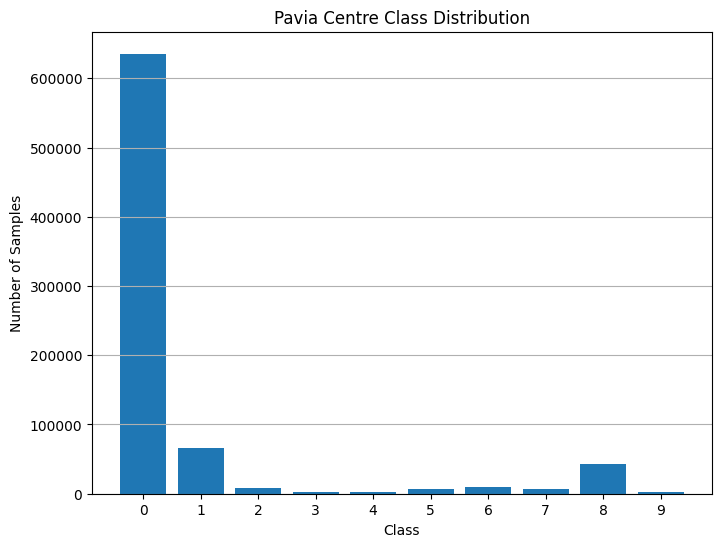

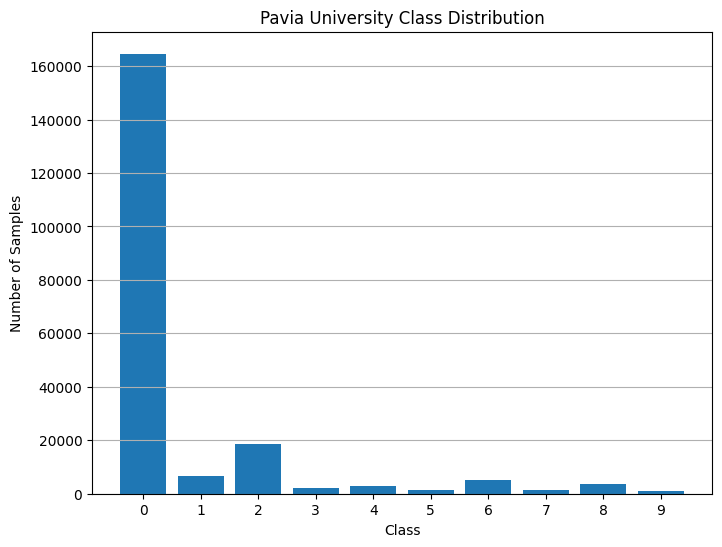

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_class_distribution(data, ground_truth, dataset_name):
    # Compute unique classes and their counts
    unique_classes, class_counts = np.unique(ground_truth, return_counts=True)

    # Plot class distribution
    plt.figure(figsize=(8, 6))
    plt.bar(unique_classes, class_counts)
    plt.xlabel('Class')
    plt.ylabel('Number of Samples')
    plt.title(f'{dataset_name} Class Distribution')
    plt.xticks(unique_classes)
    plt.grid(axis='y')
    plt.show()

for data, ground_truth, name in datasets:
    plot_class_distribution(data, ground_truth, name)


**HSI Band Visualization**

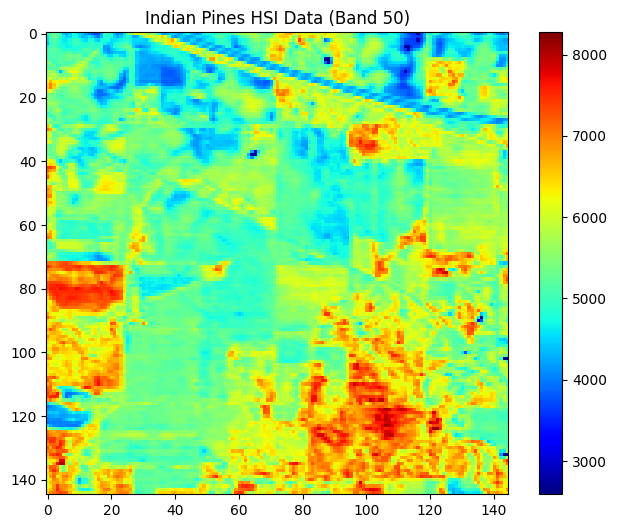

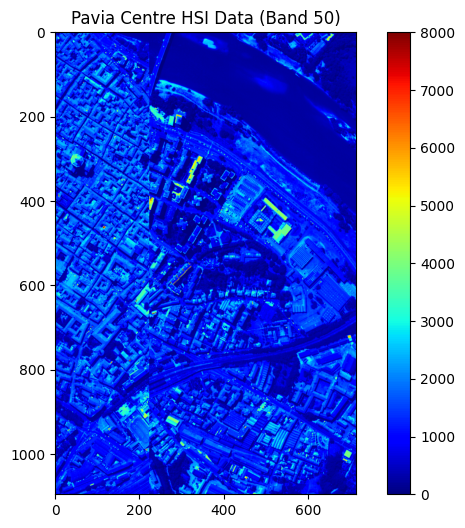

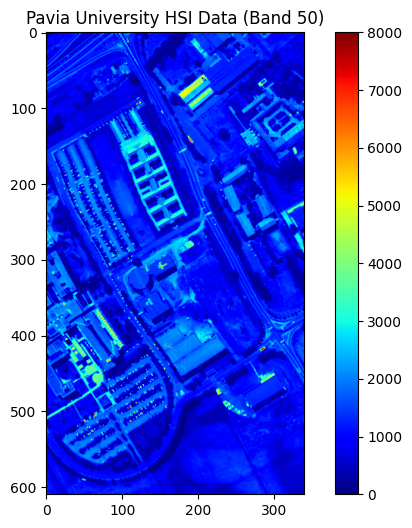

In [ ]:
import matplotlib.pyplot as plt

def plot_band(data, band_number, dataset_name):
    plt.figure(figsize=(8, 6))
    plt.imshow(data[:, :, band_number], cmap='jet')
    plt.title(f'{dataset_name} HSI Data (Band {band_number})')
    plt.colorbar()
    plt.show()

for data, ground_truth, name in datasets:
    plot_band(data, 50, name)


### Visualizes selected spectral bands from a hyperspectral dataset.
  Parameters:
  - dataset_name (str): Name of the dataset for display purposes.
  - dataset (numpy.ndarray): Hyperspectral data cube of shape (height, width, bands).
  - band_indices (list of int): Indices of the spectral bands to visualize.
  
  The function arranges the selected bands in a grid of at most 5 columns per row,
  using the 'jet' colormap to display each band. If the number of bands is not a
  multiple of 5, extra spaces in the grid remain empty.

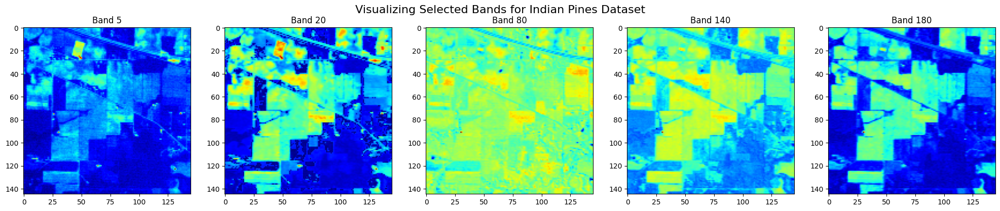

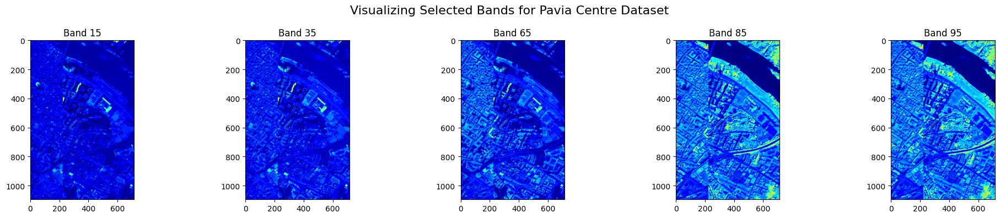

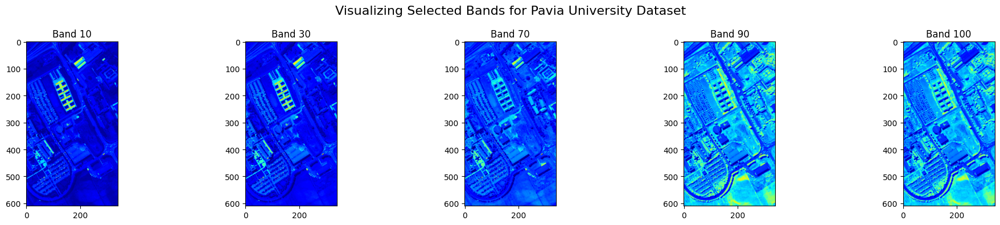

In [ ]:
def visualize_selected_bands(dataset_name, dataset, band_indices):
    num_bands_to_visualize = len(band_indices)
    num_plots = num_bands_to_visualize // 5 + (1 if num_bands_to_visualize % 5 != 0 else 0)
    fig, axes = plt.subplots(num_plots, 5, figsize=(20, num_plots * 4))
    fig.suptitle(f'Visualizing Selected Bands for {dataset_name} Dataset', fontsize=16)
    if num_plots == 1:
        axes = [axes]
    for i, band_idx in enumerate(band_indices):
        row_idx = i // 5
        col_idx = i % 5
        axes[row_idx][col_idx].imshow(dataset[:,:,band_idx], cmap='jet')
        axes[row_idx][col_idx].set_title(f'Band {band_idx}')
    plt.tight_layout()
    plt.show()

indian_pines_selected_bands = [5, 20, 80, 140, 180]
pavia_centre_selected_bands = [15, 35, 65, 85, 95]
pavia_university_selected_bands = [10, 30, 70, 90, 100]

visualize_selected_bands("Indian Pines", indian_pines_data, indian_pines_selected_bands)

visualize_selected_bands("Pavia Centre", pavia_centre_data, pavia_centre_selected_bands)

visualize_selected_bands("Pavia University", pavia_university_data, pavia_university_selected_bands)

### Plots the spectral signatures of different classes in a hyperspectral dataset.
    
Parameters:
- data (numpy.ndarray): Hyperspectral data cube of shape (height, width, bands)
  or (num_samples, num_bands) if preprocessed.
- ground_truth (numpy.ndarray): Ground truth labels corresponding to data samples.
- dataset_name (str): Name of the dataset for labeling the plot.

The function extracts unique class labels from the ground truth and computes the
average spectral signature for each class. It then visualizes these spectral
signatures as line plots to highlight differences in spectral reflectance.

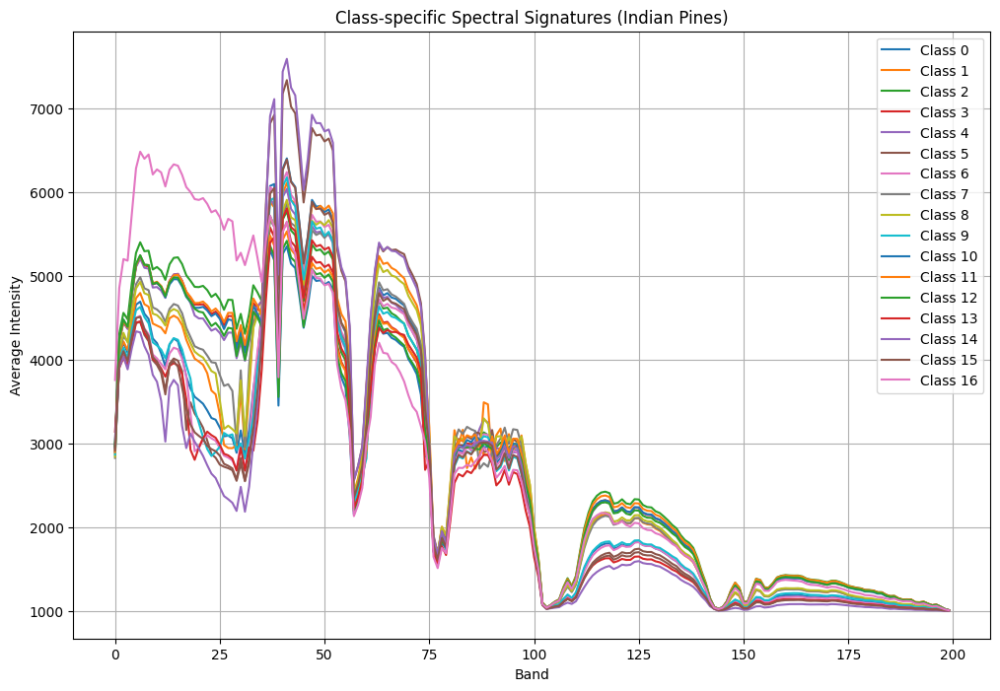

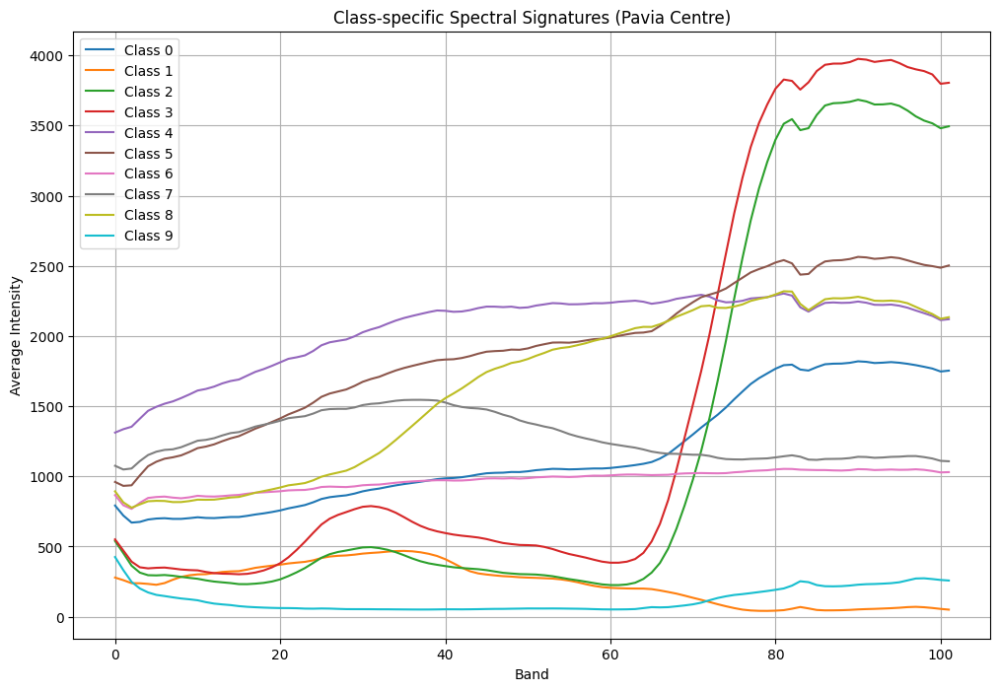

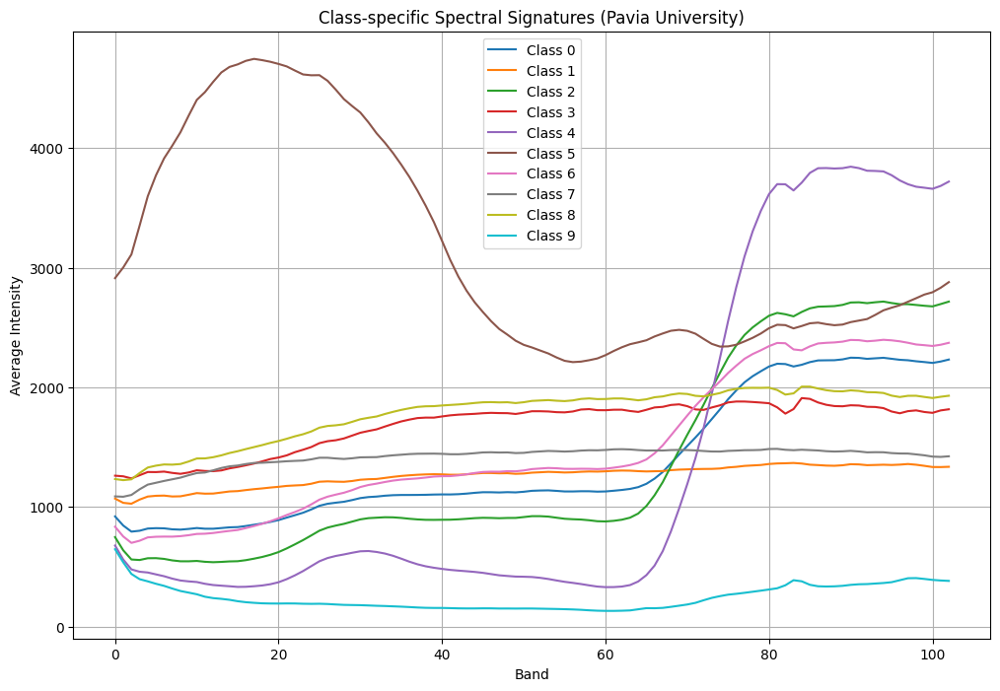

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_spectral_signatures(data, ground_truth, dataset_name):
    unique_classes = np.unique(ground_truth)
    plt.figure(figsize=(12, 8))
    for cls in unique_classes:
        cls_indices = np.where(ground_truth == cls)
        cls_samples = data[cls_indices]
        avg_spectrum = np.mean(cls_samples, axis=0)
        plt.plot(avg_spectrum, label=f'Class {cls}')

    plt.xlabel('Band')
    plt.ylabel('Average Intensity')
    plt.title(f'Class-specific Spectral Signatures ({dataset_name})')
    plt.legend()
    plt.grid(True)
    plt.show()

for data, ground_truth, name in datasets:
    plot_spectral_signatures(data, ground_truth, name)

### Displays the ground truth labels as an image for a given hyperspectral dataset.
    
Parameters:
- dataset_name (str): Name of the dataset for labeling the plot.
- ground_truth (numpy.ndarray): 2D array representing class labels for each pixel.

The function visualizes the ground truth labels using a colormap (`jet`),
where different colors represent different classes. A colorbar is included to
indicate class values.

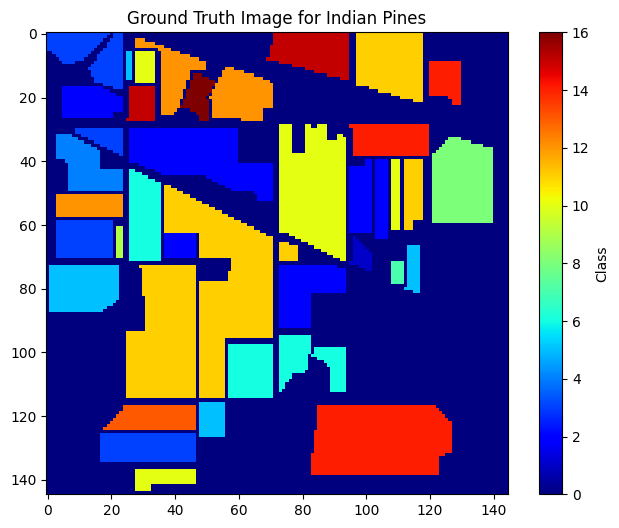

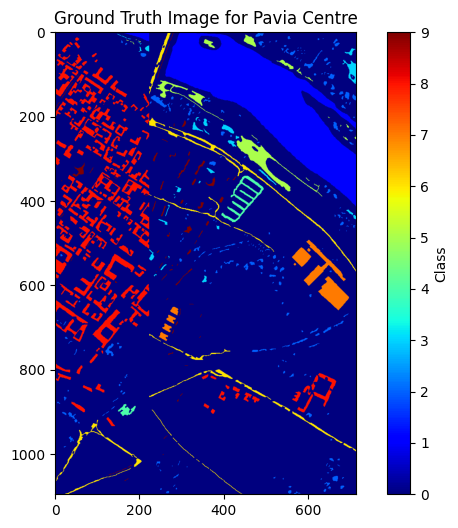

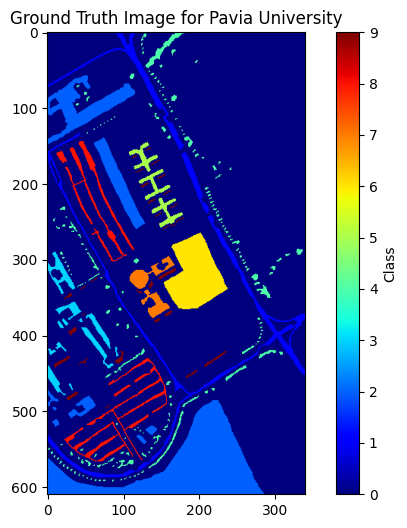

In [ ]:
def visualize_ground_truth(dataset_name, ground_truth):
    plt.figure(figsize=(8, 6))
    plt.imshow(ground_truth, cmap='jet')
    plt.title(f'Ground Truth Image for {dataset_name}')
    plt.colorbar(label='Class')
    plt.show()

for dataset, ground_truth, dataset_name in datasets:
    visualize_ground_truth(dataset_name, ground_truth)

### Visualizes the ground truth class labels of a hyperspectral dataset as an RGB image.

This function maps predefined colors to different class labels based on the dataset type
(e.g., "Indian Pines", "Pavia Centre", or "Pavia University"). It then converts the class
label matrix into a color image and displays it using matplotlib.

Parameters:
-----------
ground_truth_data : np.ndarray
    A 2D NumPy array where each element represents a class label assigned to a pixel.

dataset_name : str
    The name of the dataset. Supported datasets include:
    - "Indian Pines"
    - "Pavia Centre"
    - "Pavia University"

Behavior:
---------
- If the dataset name is recognized, the function applies the appropriate color mapping.
- If the dataset is not recognized, it prints an error message and exits.
- The function converts the ground truth labels into an RGB image and displays it using matplotlib.

Returns:
--------
None

The function directly displays the ground truth image using plt.show().

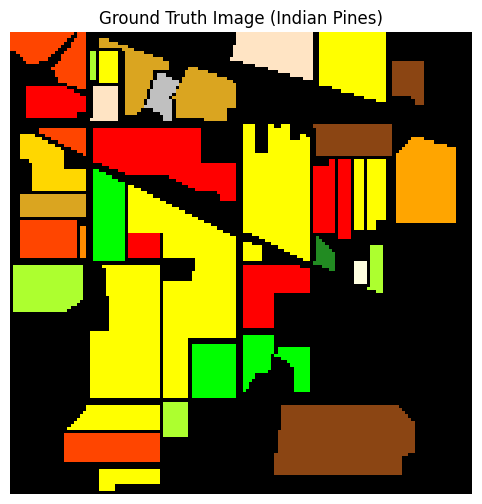

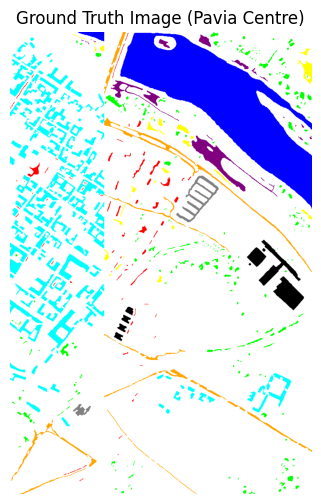

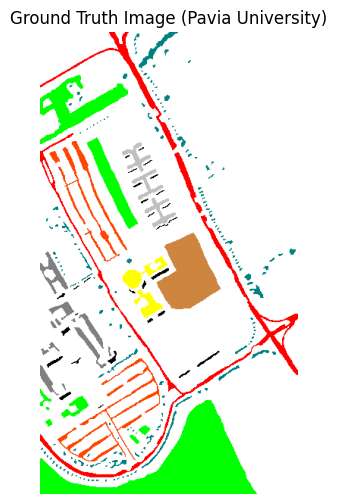

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_ground_truth(ground_truth_data, dataset_name):
    if dataset_name == "Indian Pines":
        class_colors = {
            0: [0, 0, 0],           # Background
            1: [34, 139, 34],       # Alfalfa (Green)
            2: [255, 0, 0],         # Corn-notill (Red)
            3: [255, 69, 0],        # Corn-mintill (Orange Red)
            4: [255, 215, 0],       # Corn (Gold)
            5: [173, 255, 47],      # Grass-pasture (Green Yellow)
            6: [0, 255, 0],         # Grass-trees (Lime)
            7: [255, 255, 224],     # Grass-pasture-mowed (Light Yellow)
            8: [255, 165, 0],       # Hay-windrowed (Orange)
            9: [255, 140, 0],       # Oats (Dark Orange)
            10: [255, 255, 0],      # Soybean-notill (Yellow)
            11: [255, 255, 0],      # Soybean-mintill (Yellow)
            12: [218, 165, 32],     # Soybean-clean (Goldenrod)
            13: [255, 255, 0],      # Wheat (Yellow)
            14: [139, 69, 19],      # Woods (Saddle Brown)
            15: [255, 228, 196],    # Buildings-Grass-Trees-Drives (Bisque)
            16: [192, 192, 192]     # Stone-Steel-Towers (Silver)
        }
    elif dataset_name == "Pavia Centre":
        class_colors = {
            0: [255, 255, 255],     # Unclassified (White)
            1: [0, 0, 255],         # Water (Blue)
            2: [0, 255, 0],         # Trees (Green)
            3: [255, 255, 0],       # Asphalt (Yellow)
            4: [128, 128, 128],     # Self-Blocking Bricks (Gray)
            5: [128, 0, 128],       # Bitumen (Purple)
            6: [255, 165, 0],       # Tiles (Orange)
            7: [0, 0, 0],           # Shadows (Black)
            8: [0, 255, 255],       # Meadows (Cyan)
            9: [255, 0, 0]          # Bare Soil (Red)
        }
    elif dataset_name == "Pavia University":
        class_colors = {
            0: [255, 255, 255],             # Unclassified (White)
            1: [255, 0, 0],                 # Asphalt (Red)
            2: [0, 255, 0],                 # Meadows (Green)
            3: [128, 128, 128],             # Gravel (Gray)
            4: [0, 128, 128],               # Trees (Teal)
            5: [192, 192, 192],             # Painted metal sheets (Silver)
            6: [205, 133, 63],              # Bare Soil (Brown)
            7: [255, 255, 0],               # Bitumen (Yellow)
            8: [255, 69, 0],                # Self-Blocking Bricks (Orange Red)
            9: [0, 0, 0]                    # Shadows (Black)
        }
    else:
        print("Dataset not recognized.")
        return

    y = np.zeros((ground_truth_data.size, 3))
    for i, class_label in enumerate(ground_truth_data.ravel()):
        y[i] = np.array(class_colors.get(class_label, [255, 255, 255])) / 255.

    ground_truth_image = np.reshape(y, (ground_truth_data.shape[0], ground_truth_data.shape[1], 3))
    plt.figure(figsize=(8, 6))
    plt.imshow(ground_truth_image)
    plt.title(f'Ground Truth Image ({dataset_name})')
    plt.axis('off')
    plt.show()


for dataset, ground_truth, dataset_name in datasets:
    plot_ground_truth(ground_truth, dataset_name)

### Creates a false-color image from a hyperspectral dataset using specified bands.

This function extracts three spectral bands from a hyperspectral dataset and
stacks them to form an RGB-like image. The image is then normalized between
0 and 1 for proper visualization.

Parameters:
-----------
dataset : np.ndarray
    A 3D NumPy array representing a hyperspectral image, where:
    - The first dimension is the height (rows).
    - The second dimension is the width (columns).
    - The third dimension contains spectral bands.

bands : list of int
    A list of three integers specifying the band indices to be used as the
    red, green, and blue (RGB) channels for visualization.

Returns:
--------
false_color_image : np.ndarray
    A 3D NumPy array representing the normalized false-color image.

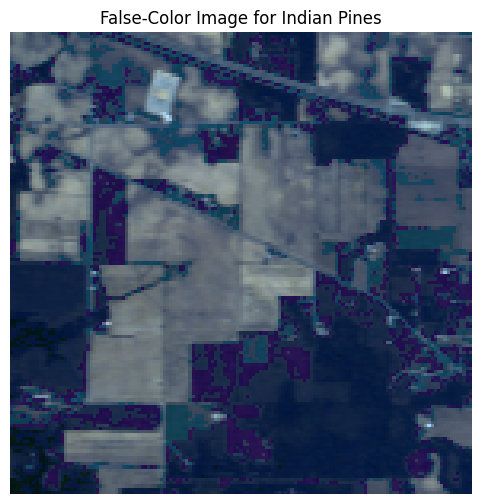

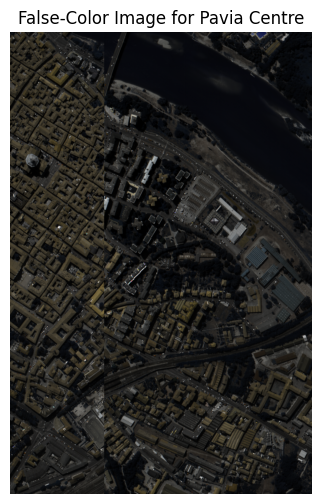

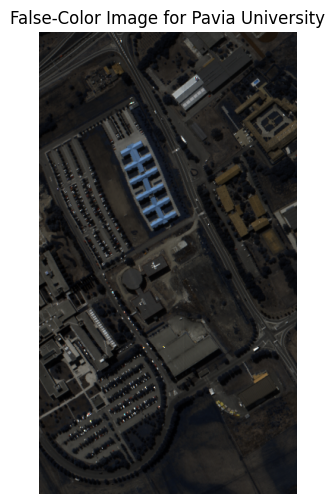

In [ ]:
def create_false_color_image(dataset, bands):
    false_color_image = np.stack((dataset[:,:,bands[0]], dataset[:,:,bands[1]], dataset[:,:,bands[2]]), axis=2)
    false_color_image = (false_color_image - np.min(false_color_image)) / (np.max(false_color_image) - np.min(false_color_image))
    return false_color_image

for dataset, ground_truth, dataset_name in datasets:
    if dataset_name == "Indian Pines":
        false_color_bands = [30, 20, 10]
    elif dataset_name == "Pavia Centre":
        false_color_bands = [55, 45, 35]
    elif dataset_name == "Pavia University":
        false_color_bands = [50, 40, 30]
    else:
        print(f"Unknown dataset: {dataset_name}")
        continue

    false_color_image = create_false_color_image(dataset, false_color_bands)
    plt.figure(figsize=(8, 6))
    plt.imshow(false_color_image)
    plt.title(f'False-Color Image for {dataset_name}')
    plt.axis('off')
    plt.show()


### Generates and displays an RGB representation of a hyperspectral image.

  This function extracts three spectral bands from the hyperspectral dataset
  and maps them to the RGB channels (red, green, and blue) for visualization.
  The image pixel values are normalized to ensure proper display.

  Parameters:
  -----------
  hyperspectral_data : np.ndarray
      A 3D NumPy array representing the hyperspectral image, where:
      - The first dimension is the height (rows).
      - The second dimension is the width (columns).
      - The third dimension contains spectral bands.

  Processing Steps:
  -----------------
  - The input hyperspectral data is normalized by dividing by 8000.
  - Three bands are selected:
      - **Band 10** → Blue channel
      - **Band 24** → Green channel
      - **Band 44** → Red channel
  - These bands are stacked to form an RGB image.
  - The pixel values are clipped to the range [0, 1] for visualization.
  - The final image is displayed using `matplotlib`.

  Returns:
  --------
  None
      The function displays the RGB image but does not return any value.



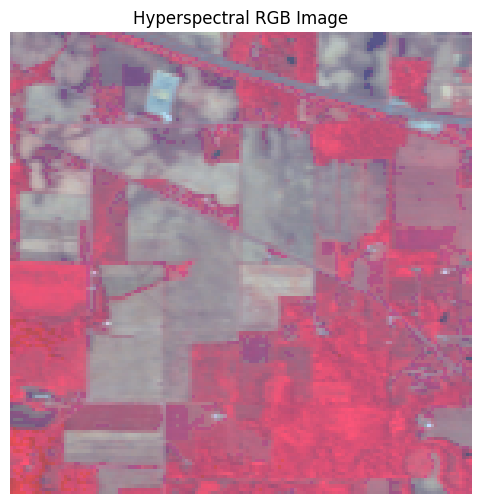

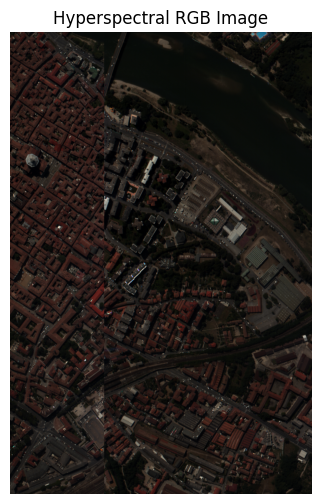

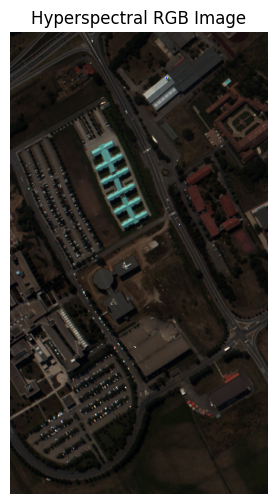

In [ ]:
# Function to process hyperspectral image data and plot the RGB image
def plot_hyperspectral_rgb(hyperspectral_data):
    data = hyperspectral_data / 8000.
    blue = data[:, :, 10]  # blue band
    green = data[:, :, 24]  # green band
    red = data[:, :, 44]  # red band
    rgb_hsi = np.zeros((data.shape[0], data.shape[1], 3))
    rgb_hsi[:, :, 0] = red
    rgb_hsi[:, :, 1] = green
    rgb_hsi[:, :, 2] = blue
    # Normalize pixel values to [0, 1] range
    rgb_hsi = np.clip(rgb_hsi, 0, 1)
    plt.figure(figsize=(8, 6))
    plt.imshow(rgb_hsi)
    plt.title('Hyperspectral RGB Image')
    plt.axis('off')
    plt.show()

# Process and plot the hyperspectral RGB image for each dataset
for hyperspectral_data in [indian_pines_data, pavia_centre_data, pavia_university_data]:
    plot_hyperspectral_rgb(hyperspectral_data)

In [ ]:
def normalize_data(raw_data):
    max_value = np.max(raw_data)
    min_value = np.min(raw_data)
    normalized_data = (raw_data - min_value) / (max_value - min_value)
    return normalized_data

indian_pines_normalized = normalize_data(indian_pines_data)
pavia_centre_normalized = normalize_data(pavia_centre_data)
pavia_university_normalized = normalize_data(pavia_university_data)

### Generates and displays an RGB representation of a hyperspectral image.

This function extracts three spectral bands from the hyperspectral dataset
and maps them to the RGB channels (red, green, and blue) for visualization.
The image pixel values are normalized to ensure proper display.

Parameters:
-----------
hyperspectral_data : np.ndarray
    A 3D NumPy array representing the hyperspectral image, where:
    - The first dimension is the height (rows).
    - The second dimension is the width (columns).
    - The third dimension contains spectral bands.

Processing Steps:
-----------------
- The input hyperspectral data is normalized by dividing by 8000.
- Three bands are selected:
    - **Band 10** → Blue channel
    - **Band 24** → Green channel
    - **Band 44** → Red channel
- These bands are stacked to form an RGB image.
- The pixel values are clipped to the range [0, 1] for visualization.
- The final image is displayed using `matplotlib`.

Returns:
--------
None
    
The function displays the RGB image but does not return any value.

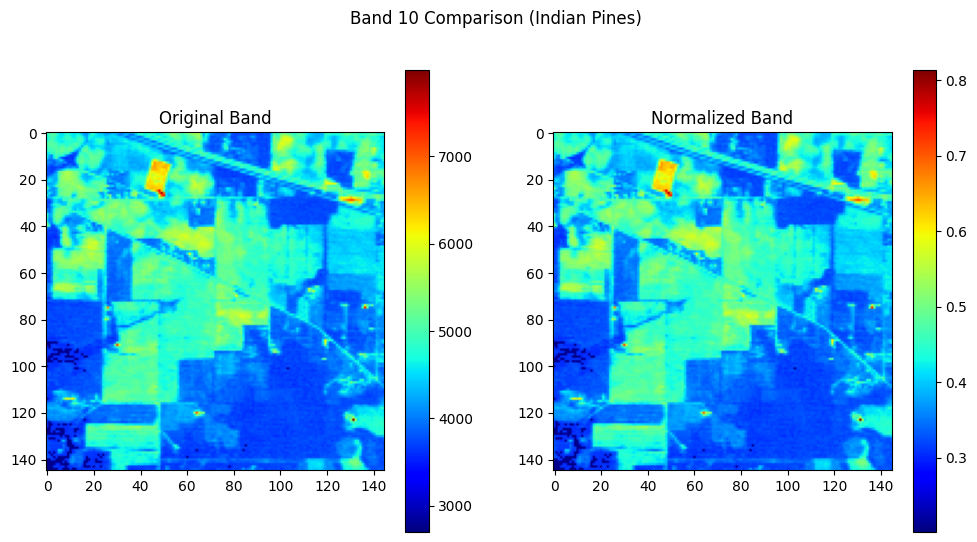

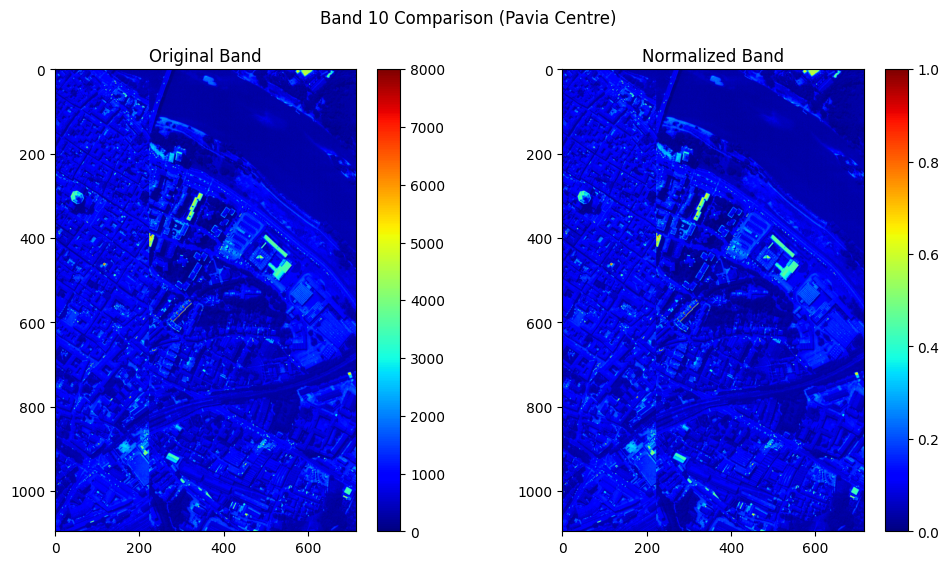

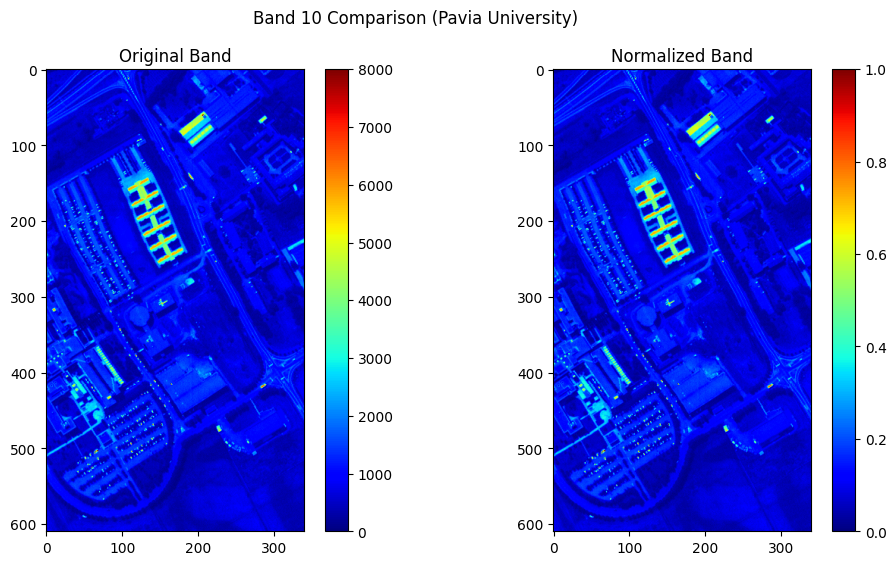

In [ ]:
import matplotlib.pyplot as plt

def plot_band_comparison(original_data, normalized_data, band_idx, dataset_name):
    original_band = original_data[:, :, band_idx]
    normalized_band = normalized_data[:, :, band_idx]

    plt.figure(figsize=(12, 6))

    # Original data
    plt.subplot(1, 2, 1)
    plt.imshow(original_band, cmap='jet')
    plt.title('Original Band')
    plt.colorbar()

    # Normalized data
    plt.subplot(1, 2, 2)
    plt.imshow(normalized_band, cmap='jet')
    plt.title('Normalized Band')
    plt.colorbar()

    plt.suptitle(f'Band {band_idx} Comparison ({dataset_name})')
    plt.show()

plot_band_comparison(indian_pines_data, indian_pines_normalized, 10, "Indian Pines")
plot_band_comparison(pavia_centre_data, pavia_centre_normalized, 10, "Pavia Centre")
plot_band_comparison(pavia_university_data, pavia_university_normalized, 10, "Pavia University")

### Compare and visualize a specific spectral band before and after normalization.

This function plots a side-by-side comparison of a selected spectral band from
the original and normalized hyperspectral datasets. The comparison helps in
understanding the effects of normalization on a given dataset.

Parameters:
-----------
original_data : np.ndarray
    A 3D NumPy array representing the original hyperspectral image, where:
    - The first dimension is the height (rows).
    - The second dimension is the width (columns).
    - The third dimension contains spectral bands.

normalized_data : np.ndarray
    A 3D NumPy array representing the normalized hyperspectral image.

band_idx : int
    The index of the spectral band to be visualized.

dataset_name : str
    The name of the dataset (e.g., "Indian Pines", "Pavia Centre", "Pavia University").

Processing Steps:
-----------------
- Extracts the specified spectral band from both the original and normalized datasets.
- Displays them side by side using `matplotlib` with a `jet` colormap.
- Adds color bars to indicate intensity values.
- Titles the plots appropriately for clarity.

Returns:
--------
None

The function directly displays the comparison plot but does not return any value.

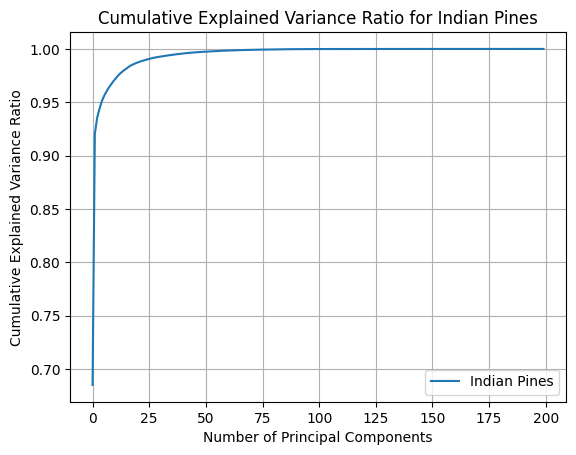

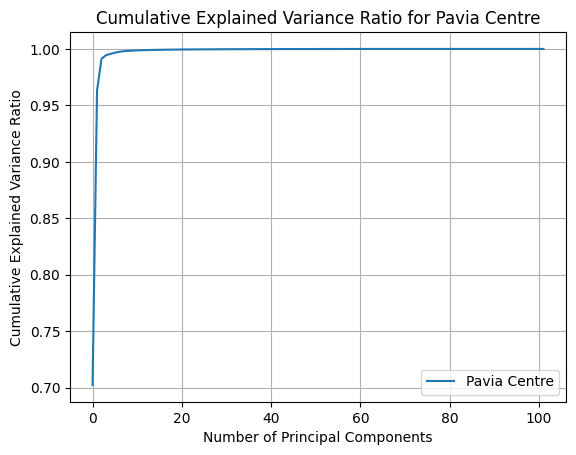

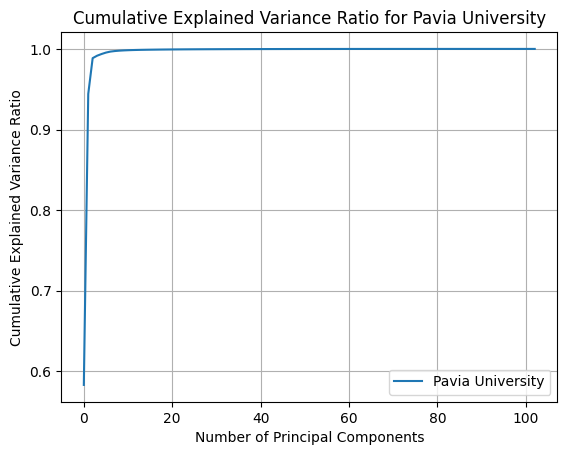

In [ ]:
from sklearn.decomposition import PCA

def plot_cumulative_variance_ratio(flattened_data, dataset_name):
    pca = PCA()
    pcX = pca.fit_transform(flattened_data)
    ev = pca.explained_variance_ratio_
    cumulative_var = np.cumsum(ev)

    plt.plot(cumulative_var, label=dataset_name)

    plt.xlabel('Number of Principal Components')
    plt.ylabel('Cumulative Explained Variance Ratio')
    plt.title('Cumulative Explained Variance Ratio for '+dataset_name)
    plt.legend()
    plt.grid(True)
    plt.show()

# Reshape or flatten the datasets
indian_pines_flattened = indian_pines_normalized.reshape(-1, indian_pines_normalized.shape[-1])
pavia_centre_flattened = pavia_centre_normalized.reshape(-1, pavia_centre_normalized.shape[-1])
pavia_university_flattened = pavia_university_normalized.reshape(-1, pavia_university_normalized.shape[-1])

plot_cumulative_variance_ratio(indian_pines_flattened, "Indian Pines")
plot_cumulative_variance_ratio(pavia_centre_flattened, "Pavia Centre")
plot_cumulative_variance_ratio(pavia_university_flattened, "Pavia University")


### Applies Principal Component Analysis (PCA) to a 3D hyperspectral dataset and reduces its dimensionality to the specified number of components.

This function reshapes the input hyperspectral data from a 3D array (samples x features x bands)
to a 2D array (samples * features x bands), applies PCA to reduce the dimensionality, and
then reshapes the transformed data back to its original spatial dimensions with the reduced number
of components.

Parameters:
-----------
data : np.ndarray
    A 3D NumPy array with shape (num_samples, num_features, num_bands), where:
    - `num_samples`: Number of samples (rows in the image).
    - `num_features`: Number of features (columns in the image).
    - `num_bands`: Number of spectral bands in the hyperspectral data.

input_dimension : int
    The number of principal components to retain after applying PCA.

Returns:
--------
np.ndarray
    A 3D NumPy array of the same shape as the input data (num_samples, num_features, input_dimension),
    where the third dimension is reduced to `input_dimension` principal components.

In [ ]:
from sklearn.decomposition import PCA

def dimension_PCA(data, input_dimension):
    # Reshape the data into a 2D array (samples x features)
    num_samples, num_features, num_bands = data.shape
    flattened_data = data.reshape(num_samples * num_features, num_bands)

    # Apply PCA to the flattened data
    pca = PCA(n_components=input_dimension)
    pca.fit(flattened_data)

    # Transform the data back to the original shape
    transformed_data = pca.transform(flattened_data)
    whole_pca = transformed_data.reshape(num_samples, num_features, input_dimension)

    return whole_pca


indian_pines_pca = dimension_PCA(indian_pines_normalized, 30)
pavia_centre_pca = dimension_PCA(pavia_centre_normalized,10)
pavia_university_pca = dimension_PCA(pavia_university_normalized, 10)

print(indian_pines_pca.shape)
print(pavia_centre_pca.shape)
print(pavia_university_pca.shape)

(145, 145, 30)
(1096, 715, 10)
(610, 340, 10)


### Plots the specified number of principal components from the PCA-transformed data.

This function generates subplots displaying the first `num_components` principal components
of the PCA-transformed hyperspectral data. Each subplot corresponds to one principal component,
and the images are visualized using the 'jet' colormap.

Parameters:
-----------
pca_data : np.ndarray
    A 3D NumPy array with the shape (num_samples, num_features, num_components), where:
    - `num_samples`: Number of pixels (rows in the image).
    - `num_features`: Number of columns or features (columns in the image).
    - `num_components`: Number of principal components (reduced dimensions after PCA).

dataset_name : str
    The name of the dataset to be used in the title of the plot.

num_components : int, optional, default=3
    The number of principal components to display. This defines how many PCA components will be shown in the subplots.

Returns:
--------
None

This function generates and displays the plots, but does not return any values.

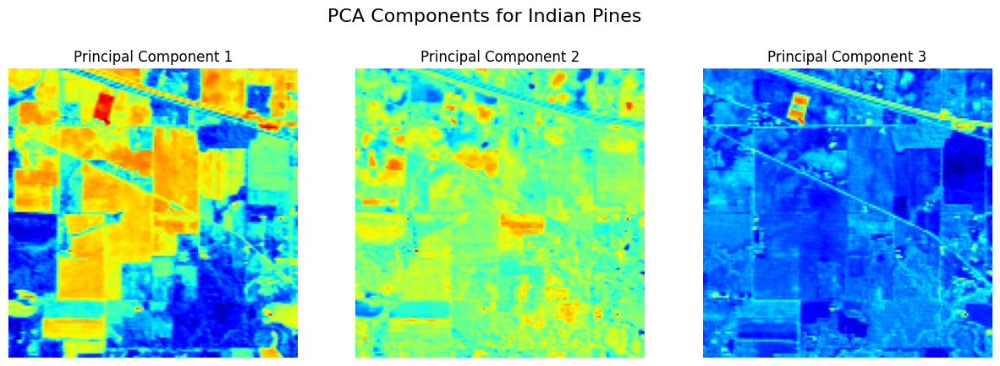

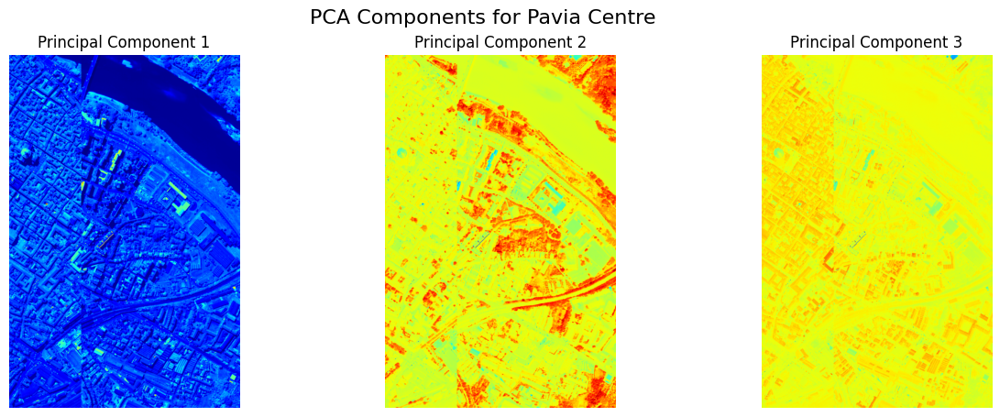

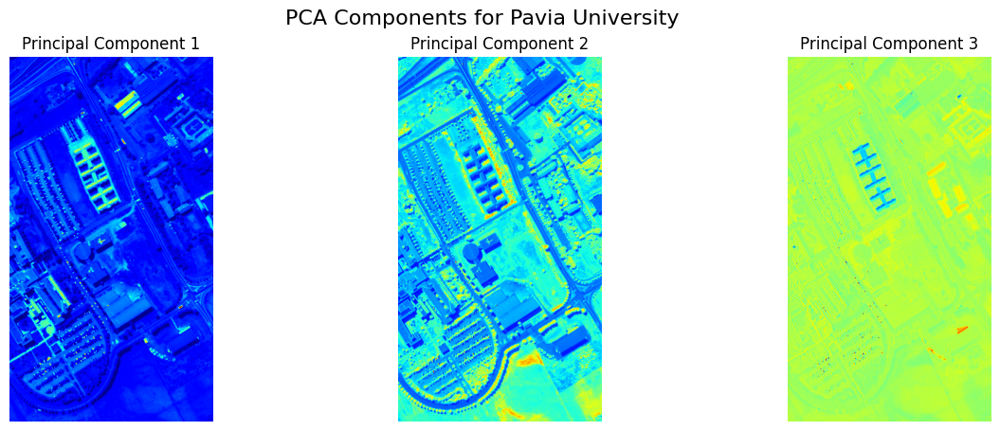

In [ ]:
def plot_pca_components(pca_data, dataset_name, num_components=3):
    fig, axes = plt.subplots(1, num_components, figsize=(15, 5))
    for i in range(num_components):
        axes[i].imshow(pca_data[:, :, i], cmap='jet')
        axes[i].set_title(f'Principal Component {i+1}')
        axes[i].axis('off')
    fig.suptitle(f'PCA Components for {dataset_name}', fontsize=16)
    plt.show()

plot_pca_components(indian_pines_pca, 'Indian Pines')
plot_pca_components(pavia_centre_pca, 'Pavia Centre')
plot_pca_components(pavia_university_pca, 'Pavia University')


### Creates a pseudocolor image using selected bands from PCA-transformed data.

This function generates a pseudocolor image by stacking three specified principal
components (or bands) from the PCA-transformed hyperspectral data. The image
is then normalized to ensure the pixel values are within the range [0, 1].

Parameters:
-----------
pca_data : np.ndarray
    A 3D NumPy array representing the PCA-transformed hyperspectral data,
    with shape (num_samples, num_features, num_components). The data is
    expected to be PCA-reduced, where each component represents a principal
    component in the hyperspectral image.

bands : list of int
    A list containing the indices of the three principal components (bands)
    to be used for creating the pseudocolor image.

Returns:
--------
np.ndarray
    A 3D NumPy array with shape (num_samples, num_features, 3) representing
    the RGB pseudocolor image created from the selected principal components.

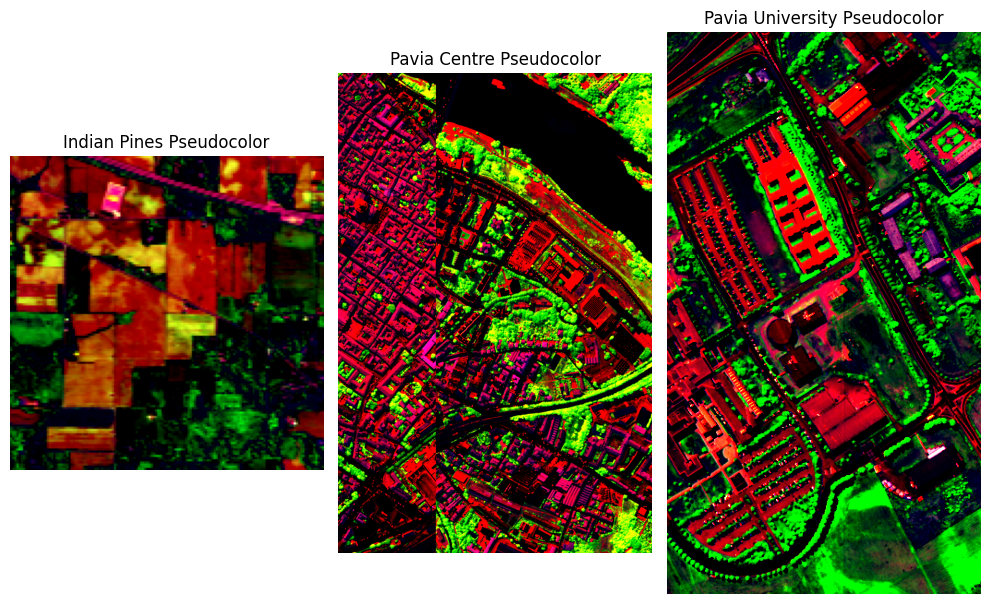

In [ ]:
def create_pseudocolor_image(pca_data, bands):
    # Use selected principal components for pseudocolor visualization
    pseudocolor_image = np.stack((pca_data[:,:,bands[0]], pca_data[:,:,bands[1]], pca_data[:,:,bands[2]]), axis=2)

    # Normalize the pseudocolor image data
    pseudocolor_image = np.clip(pseudocolor_image, 0, 1)  # Ensure values are within [0, 1]

    return pseudocolor_image

# Parameters
pseudocolor_bands = [0, 1, 2]  # Bands for pseudocolor visualization

# Create pseudocolor images for each dataset
indian_pines_pseudocolor = create_pseudocolor_image(indian_pines_pca, pseudocolor_bands)
pavia_centre_pseudocolor = create_pseudocolor_image(pavia_centre_pca, pseudocolor_bands)
pavia_university_pseudocolor = create_pseudocolor_image(pavia_university_pca, pseudocolor_bands)

# Plot pseudocolor images for each dataset
plt.figure(figsize=(10, 8))

plt.subplot(131)
plt.imshow(indian_pines_pseudocolor)
plt.title('Indian Pines Pseudocolor')
plt.axis('off')

plt.subplot(132)
plt.imshow(pavia_centre_pseudocolor)
plt.title('Pavia Centre Pseudocolor')
plt.axis('off')

plt.subplot(133)
plt.imshow(pavia_university_pseudocolor)
plt.title('Pavia University Pseudocolor')
plt.axis('off')

plt.tight_layout()
plt.show()

## Data Preprocessing

### Adds zero-padding to the input data (X) along both spatial dimensions.

This function ensures that the input data has additional border rows and columns filled with zeros,
which helps in generating patches for analysis without encountering boundary issues.

Parameters:
-----------
X : np.ndarray
    A 3D NumPy array representing the input data with shape (height, width, num_bands).
    This represents the hyperspectral image data to which padding will be added.

margin : int, optional, default=2
    The amount of padding (zeros) to add along each dimension. The padding is applied equally
    to all sides of the input data. The default is 2.

Returns:
--------
np.ndarray
    A 3D NumPy array of the same type as X, but with added padding, with shape
    (height + 2*margin, width + 2*margin, num_bands).


---



### Creates image patches from input data (X) and their corresponding labels (y).
    
This function generates square patches from the input data, using a sliding window approach.
Each patch contains a window of the original data along with its associated label.
Optionally, zero-label patches can be removed to ensure only labeled data is included.

Parameters:
-----------
X : np.ndarray
    A 3D NumPy array representing the input data with shape (height, width, num_bands).
    This is the hyperspectral image data from which patches will be extracted.

y : np.ndarray
    A 2D NumPy array with shape (height, width), representing the labels for each pixel in X.

windowSize : int, optional, default=5
    The size of the window to extract as patches. The patch will be of shape (windowSize, windowSize, num_bands).
    The default size is 5x5 pixels.

removeZeroLabels : bool, optional, default=True
    Whether to remove patches where the label is zero. If True, patches with zero labels are excluded
    from the final patches data. The labels are then adjusted by subtracting 1 to avoid zero-based labels.

Returns:
--------
tuple of np.ndarray
    - patchesData: A 4D NumPy array of shape (num_patches, windowSize, windowSize, num_bands),
      where each patch is extracted from the input data.
    - patchesLabels: A 1D NumPy array of shape (num_patches,) containing the label corresponding to
      each patch. Labels are adjusted to be zero-indexed if `removeZeroLabels=True`.

In [ ]:
def padWithZeros(X, margin=2):
    newX = np.zeros((X.shape[0] + 2 * margin, X.shape[1] + 2* margin, X.shape[2]))
    x_offset = margin
    y_offset = margin
    newX[x_offset:X.shape[0] + x_offset, y_offset:X.shape[1] + y_offset, :] = X
    return newX

def createPatches(X, y, windowSize=5, removeZeroLabels = True):
    margin = int((windowSize - 1) / 2)
    zeroPaddedX = padWithZeros(X, margin=margin)
    # split patches
    patchesData = np.zeros((X.shape[0] * X.shape[1], windowSize, windowSize, X.shape[2]))
    patchesLabels = np.zeros((X.shape[0] * X.shape[1]))
    patchIndex = 0
    for r in range(margin, zeroPaddedX.shape[0] - margin):
        for c in range(margin, zeroPaddedX.shape[1] - margin):
            patch = zeroPaddedX[r - margin:r + margin + 1, c - margin:c + margin + 1]
            patchesData[patchIndex, :, :, :] = patch
            patchesLabels[patchIndex] = y[r-margin, c-margin]
            patchIndex = patchIndex + 1
    if removeZeroLabels:
        patchesData = patchesData[patchesLabels>0,:,:,:]
        patchesLabels = patchesLabels[patchesLabels>0]
        patchesLabels -= 1
    return patchesData, patchesLabels

windowSize = 5
XPatches, yPatches = createPatches(indian_pines_pca, indian_pines_gt, windowSize=windowSize)
print("Indian Pines patches shape - X:", XPatches.shape, "y:", yPatches.shape)


Indian Pines patches shape - X: (10249, 5, 5, 30) y: (10249,)


In [ ]:
testRatio = 0.2
X_train, X_test, y_train, y_test = train_test_split(XPatches, yPatches, test_size=testRatio, random_state=345,
                                                        stratify=yPatches)
print("X_train shape: "+str(X_train.shape))
print("y_train shape: "+str(y_train.shape))
print("X_test shape: "+str(X_test.shape))
print("y_test shape: "+str(y_test.shape))

X_train shape: (8199, 5, 5, 30)
y_train shape: (8199,)
X_test shape: (2050, 5, 5, 30)
y_test shape: (2050,)


### Oversamples the weaker classes in the dataset to balance class distribution.

This function takes input data (X) and labels (y), identifies the class imbalance,
and repeats instances of the underrepresented classes to match the size of the majority class.
The resulting dataset is shuffled to avoid any ordering bias.

Parameters:
-----------
X : np.ndarray
    A 4D NumPy array with shape (num_samples, height, width, num_bands), where each sample
    is a patch or image slice containing the data for a given label.

y : np.ndarray
    A 1D NumPy array with shape (num_samples,) representing the labels for each corresponding
    sample in X. The labels should be discrete integers, and the classes may be imbalanced.

Returns:
--------
tuple of np.ndarray
    - newX: A 4D NumPy array with shape (num_samples_new, height, width, num_bands),
      containing the oversampled data with balanced class distribution.
    - newY: A 1D NumPy array with shape (num_samples_new,), containing the oversampled labels
      corresponding to the oversampled data.

In [ ]:
def oversampleWeakClasses(X, y):
    uniqueLabels, labelCounts = np.unique(y, return_counts=True)
    maxCount = np.max(labelCounts)
    labelInverseRatios = maxCount / labelCounts
    # repeat for every label and concat
    newX = X[y == uniqueLabels[0], :, :, :].repeat(round(labelInverseRatios[0]), axis=0)
    newY = y[y == uniqueLabels[0]].repeat(round(labelInverseRatios[0]), axis=0)
    for label, labelInverseRatio in zip(uniqueLabels[1:], labelInverseRatios[1:]):
        cX = X[y== label,:,:,:].repeat(round(labelInverseRatio), axis=0)
        cY = y[y == label].repeat(round(labelInverseRatio), axis=0)
        newX = np.concatenate((newX, cX))
        newY = np.concatenate((newY, cY))
    np.random.seed(seed=42)
    rand_perm = np.random.permutation(newY.shape[0])
    newX = newX[rand_perm, :, :, :]
    newY = newY[rand_perm]
    return newX, newY

X_train, y_train = oversampleWeakClasses(X_train, y_train)

### Augments the training data by applying random transformations
(flipping or rotation)
to each image patch in the dataset to artificially increase the dataset size and
introduce variability for model generalization.

The augmentation process involves:
1. Flipping the patches either horizontally or vertically.
2. Randomly rotating the patches by a multiple of 30 degrees within the range -180 to 180 degrees.

The augmented patches replace the original patches in the dataset.

Parameters:
-----------
X_train : np.ndarray
    A 4D NumPy array with shape (num_samples, height, width, num_bands), where each sample
    is an image patch.

Returns:
--------
np.ndarray
    A 4D NumPy array with the augmented data, where each patch has been transformed (flipped
    or rotated) randomly.

Notes:
------
The function modifies the input dataset `X_train` in place. It applies transformations to
half of the dataset. If additional augmentations are needed, you may want to call the function
again or modify the logic.

In [ ]:
def AugmentData(X_train):
    for i in range(int(X_train.shape[0]/2)):
        patch = X_train[i,:,:,:]
        num = random.randint(0,2)
        if (num == 0):

            flipped_patch = np.flipud(patch)
        if (num == 1):

            flipped_patch = np.fliplr(patch)
        if (num == 2):

            no = random.randrange(-180,180,30)
            flipped_patch = scipy.ndimage.interpolation.rotate(patch, no,axes=(1, 0),
                                                               reshape=False, output=None, order=3, mode='constant', cval=0.0, prefilter=False)


    patch2 = flipped_patch
    X_train[i,:,:,:] = patch2

    return X_train


X_train = AugmentData(X_train)

<ipython-input-26-12338f1f7cfb>:14: DeprecationWarning: Please import `rotate` from the `scipy.ndimage` namespace; the `scipy.ndimage.interpolation` namespace is deprecated and will be removed in SciPy 2.0.0.
  flipped_patch = scipy.ndimage.interpolation.rotate(patch, no,axes=(1, 0),


### Saves preprocessed training and test data patches and their corresponding labels into .npy files.

The saved files include:
1. Training patches (X_trainPatches)
2. Test patches (X_testPatches)
3. Training labels (y_trainPatches)
4. Test labels (y_testPatches)

The filenames are generated dynamically based on the window size, PCA components, and test ratio.

Parameters:
-----------
X_trainPatches : np.ndarray
    A 4D array containing the training image patches.
X_testPatches : np.ndarray
    A 4D array containing the test image patches.
y_trainPatches : np.ndarray
    A 1D array containing the training labels corresponding to the training patches.
y_testPatches : np.ndarray
    A 1D array containing the test labels corresponding to the test patches.
windowSize : int
    The size of the window (patch) used for extracting image patches.
numPCAComponents : int, optional, default=0
    The number of PCA components used (if applicable) for dimensionality reduction.
testRatio : float, optional, default=0.25
    The ratio of the dataset to be used for testing.

Returns:
--------
None
    
The function does not return anything. It saves the data to the disk.

In [ ]:
import os
def savePreprocessedData(X_trainPatches, X_testPatches, y_trainPatches, y_testPatches, windowSize, numPCAComponents = 0, testRatio = 0.25):
        path= "/kaggle/working/indian_pines_2DCNN/"
        if not os.path.exists(path):
            os.makedirs(path)

        with open(path +"/Xtrain"+ str(windowSize) + "PCA" + str(numPCAComponents) + "testRatio" + str(testRatio) + ".npy", 'bw') as outfile:
            np.save(outfile, X_trainPatches)
        with open(path +"/Xtest"+ str(windowSize) + "PCA" + str(numPCAComponents) + "testRatio" + str(testRatio) + ".npy", 'bw') as outfile:
            np.save(outfile, X_testPatches)
        with open(path +"/ytrain"+ str(windowSize) + "PCA" + str(numPCAComponents) + "testRatio" + str(testRatio) + ".npy", 'bw') as outfile:
            np.save(outfile, y_trainPatches)
        with open(path +"/ytest"+ str(windowSize) + "PCA" + str(numPCAComponents) + "testRatio" + str(testRatio) + ".npy", 'bw') as outfile:
            np.save(outfile, y_testPatches)

numComponents=30
savePreprocessedData(X_train, X_test, y_train, y_test, windowSize = windowSize, numPCAComponents = numComponents, testRatio = testRatio)

In [ ]:
# Reshape X_train to NHWC format
X_train = np.transpose(X_train, (0, 2, 3, 1))
X_train.shape

(31690, 5, 30, 5)

In [ ]:
# Define input shape based on X_train
input_shape = X_train.shape[1:]
input_shape

(5, 30, 5)

In [ ]:
# convert class labels to on-hot encoding
y_train = to_categorical(y_train)
y_train.shape

(31690, 16)

In [ ]:
# number of filters
C1 = 3*numComponents

## Model **Training**

In [ ]:
# Define the model
EPOCHS = 1
model = Sequential()

model.add(Conv2D(C1, (3, 3), activation='relu', input_shape=input_shape))
model.add(Conv2D(3*C1, (3, 3), activation='relu'))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(6*numComponents, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(16, activation='softmax'))

#sgd = SGD(lr=0.0001, momentum=0.9, nesterov=True)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=32, epochs=EPOCHS)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


991/991 ━━━━━━━━━━━━━━━━━━━━ 58s 56ms/step - accuracy: 0.7823 - loss: 0.6537


In [ ]:
from keras.utils import plot_model
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

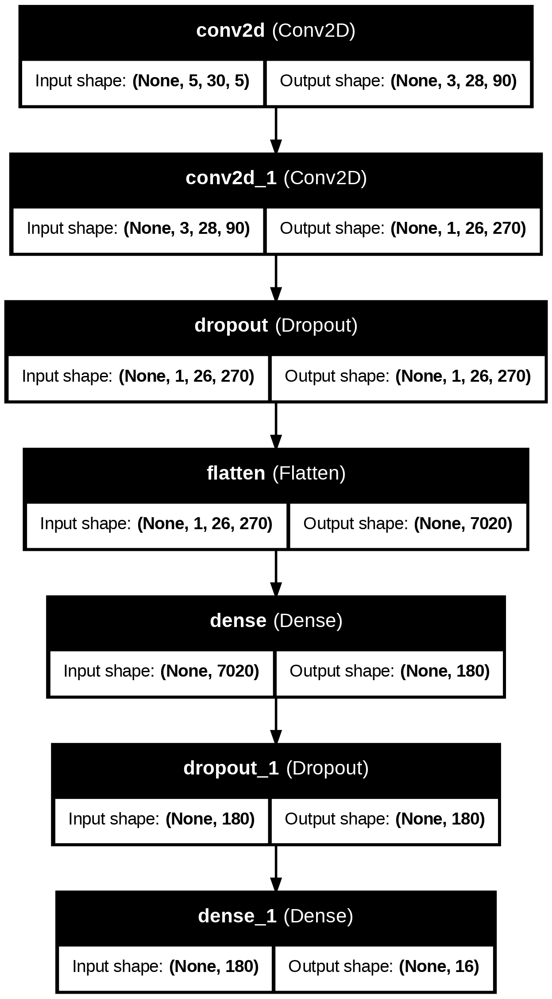

## Model Evaluation

In [ ]:
from sklearn.decomposition import PCA
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix
import itertools
import spectral

### Generates a classification report, confusion matrix, and evaluation metrics for a trained model on test data.

Args:
    X_test (numpy.ndarray): The input features of the test set. Shape should be (n_samples, height, width, channels).
    y_test (numpy.ndarray): The true labels of the test set, one-hot encoded. Shape should be (n_samples, num_classes).

Returns:
    classification (str): A string representing the classification report, which includes precision, recall, f1-score, and support for each class.
    confusion (numpy.ndarray): A confusion matrix, representing the number of correct and incorrect predictions for each class.
    test_Loss (float): The loss value on the test set, multiplied by 100 for percentage representation.
    test_accuracy (float): The accuracy on the test set, multiplied by 100 for percentage representation.

The function uses the trained model to predict the labels for the test set and calculates:
    1. A classification report that includes precision, recall, and F1-score for each class.
    2. A confusion matrix that shows the number of true positives, false positives, true negatives, and false negatives.
    3. The loss and accuracy values of the model on the test data.

The following class labels are used for the classification report and confusion matrix:
- 'Alfalfa', 'Corn-notill', 'Corn-mintill', 'Corn', 'Grass-pasture', 'Grass-trees',
- 'Grass-pasture-mowed', 'Hay-windrowed', 'Oats', 'Soybean-notill', 'Soybean-mintill',
- 'Soybean-clean', 'Wheat', 'Woods', 'Buildings-Grass-Trees-Drives', 'Stone-Steel-Towers'

In [ ]:
def reports (X_test,y_test):
    Y_pred = model.predict(X_test)
    y_pred = np.argmax(Y_pred, axis=1)
    target_names = ['Alfalfa', 'Corn-notill', 'Corn-mintill', 'Corn', 'Grass-pasture', 'Grass-trees',
    'Grass-pasture-mowed', 'Hay-windrowed', 'Oats', 'Soybean-notill', 'Soybean-mintill', 'Soybean-clean',
    'Wheat', 'Woods', 'Buildings-Grass-Trees-Drives', 'Stone-Steel-Towers']
    classification = classification_report(np.argmax(y_test, axis=1), y_pred, target_names=target_names)
    confusion = confusion_matrix(np.argmax(y_test, axis=1), y_pred)
    score = model.evaluate(X_test, y_test, batch_size=32)
    test_Loss =  score[0]*100
    test_accuracy = score[1]*100
    return classification, confusion, test_Loss, test_accuracy

In [ ]:
X_test=np.load("/kaggle/working/indian_pines_2DCNN/Xtest5PCA30testRatio0.2.npy")
y_test=np.load("/kaggle/working/indian_pines_2DCNN/ytest5PCA30testRatio0.2.npy")

In [ ]:
X_test = np.transpose(X_test, (0, 2, 3, 1))
y_test = to_categorical(y_test)

In [ ]:
classification, confusion, test_loss, test_accuracy = reports(X_test,y_test)
classification = str(classification)
confusion = str(confusion)
print("Classification:")
print(classification)
print("Test loss: "+str(test_loss)+" %")
print("Test accuracy: "+str(test_accuracy)+" %")

65/65 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step
65/65 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9560 - loss: 0.1429
Classification:
                              precision    recall  f1-score   support

                     Alfalfa       1.00      1.00      1.00         9
                 Corn-notill       0.95      0.95      0.95       286
                Corn-mintill       0.93      0.98      0.96       166
                        Corn       0.94      1.00      0.97        47
               Grass-pasture       1.00      0.99      0.99        97
                 Grass-trees       1.00      0.99      1.00       146
         Grass-pasture-mowed       1.00      1.00      1.00         5
               Hay-windrowed       1.00      1.00      1.00        96
                        Oats       0.67      1.00      0.80         4
              Soybean-notill       0.87      0.98      0.92       194
             Soybean-mintill       0.98      0.89      0.93       491
               Soybean-clean 

65/65 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


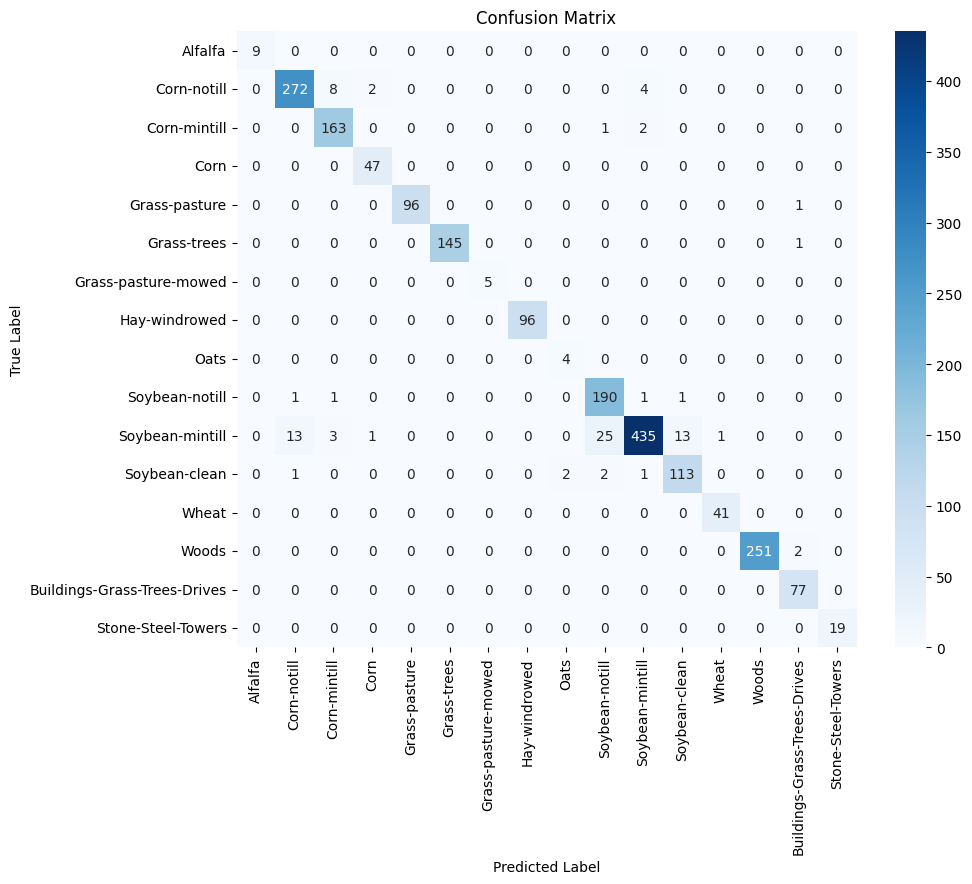

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Make predictions on the test set
y_pred = model.predict(X_test)

# Convert predictions to class labels
y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Create confusion matrix
conf_matrix = confusion_matrix(y_test_labels, y_pred_labels)

target_names = ['Alfalfa', 'Corn-notill', 'Corn-mintill', 'Corn', 'Grass-pasture', 'Grass-trees',
    'Grass-pasture-mowed', 'Hay-windrowed', 'Oats', 'Soybean-notill', 'Soybean-mintill', 'Soybean-clean',
    'Wheat', 'Woods', 'Buildings-Grass-Trees-Drives', 'Stone-Steel-Towers']
# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
X, y = oversampleWeakClasses(XPatches, yPatches)
X= AugmentData(X)
X = np.transpose(X, (0, 2, 3, 1))
y = to_categorical(y)
predictions=model.predict(X)

<ipython-input-26-12338f1f7cfb>:14: DeprecationWarning: Please import `rotate` from the `scipy.ndimage` namespace; the `scipy.ndimage.interpolation` namespace is deprecated and will be removed in SciPy 2.0.0.
  flipped_patch = scipy.ndimage.interpolation.rotate(patch, no,axes=(1, 0),


1236/1236 ━━━━━━━━━━━━━━━━━━━━ 15s 13ms/step
